In [7]:
from tqdm.auto import tqdm
import os

from src.task_1 import extract_patches, cell_segmentation, visualize_segmentation

In [8]:
# List all files in both directories
high_emt_files = os.listdir("data/high-EMT/")
low_emt_files = os.listdir("data/low-EMT/")

# Define the base directories
base_dir_high = "data/high-EMT/"
base_dir_low = "data/low-EMT/"

# Create a list of full paths
wsi_paths = [os.path.join(base_dir_high, file) for file in high_emt_files] + [os.path.join(base_dir_low, file) for file in low_emt_files]

In [9]:
level = 0
patch_size = 512  # in pixels
num_patches = 2

In [10]:
all_patches = []
for wsi_path in tqdm(wsi_paths):
    patches = extract_patches(wsi_path, patch_size, level, num_patches)
    all_patches.extend(patches)

  0%|          | 0/10 [00:00<?, ?it/s]

In [11]:
segmented_patches = cell_segmentation(all_patches)

  0%|          | 0/4 [00:00<?, ?it/s]

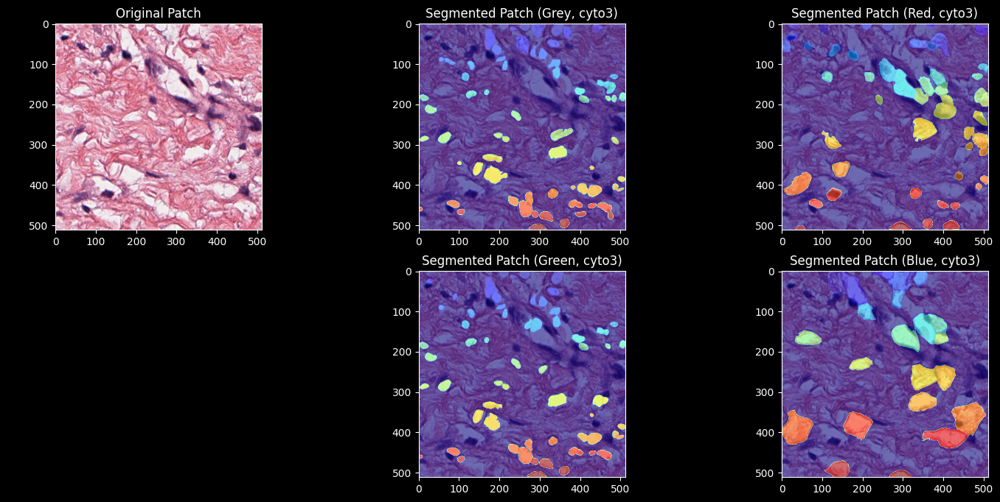

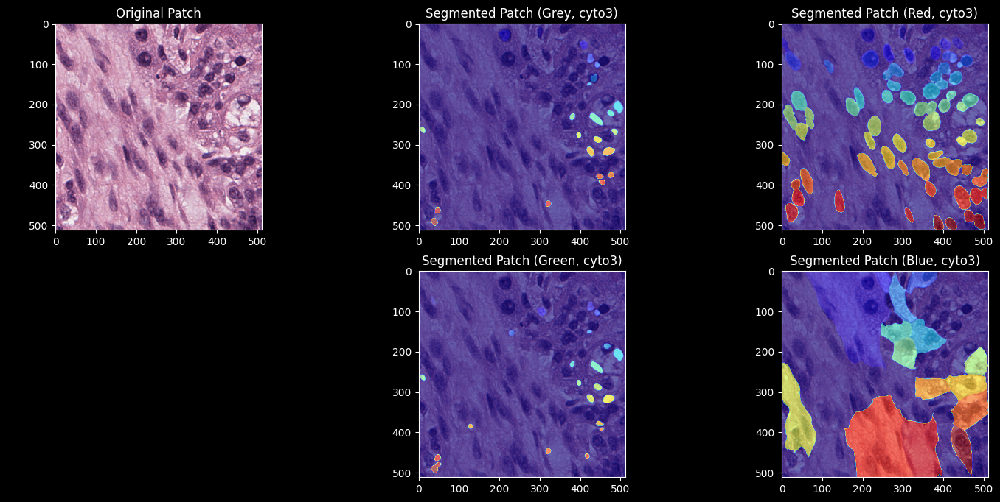

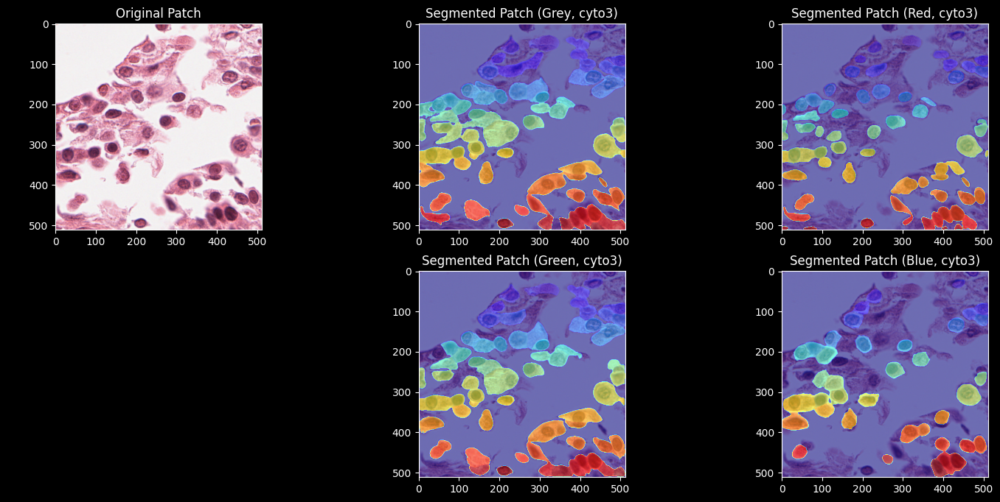

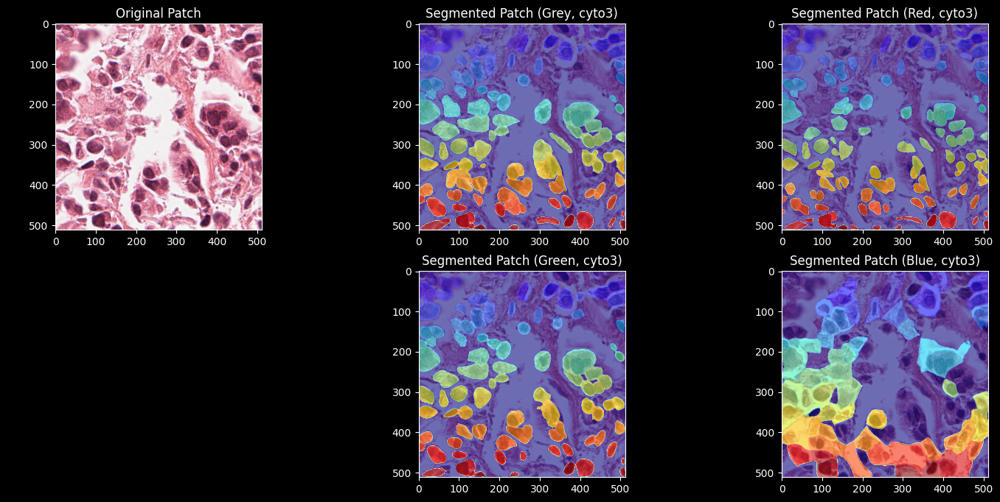

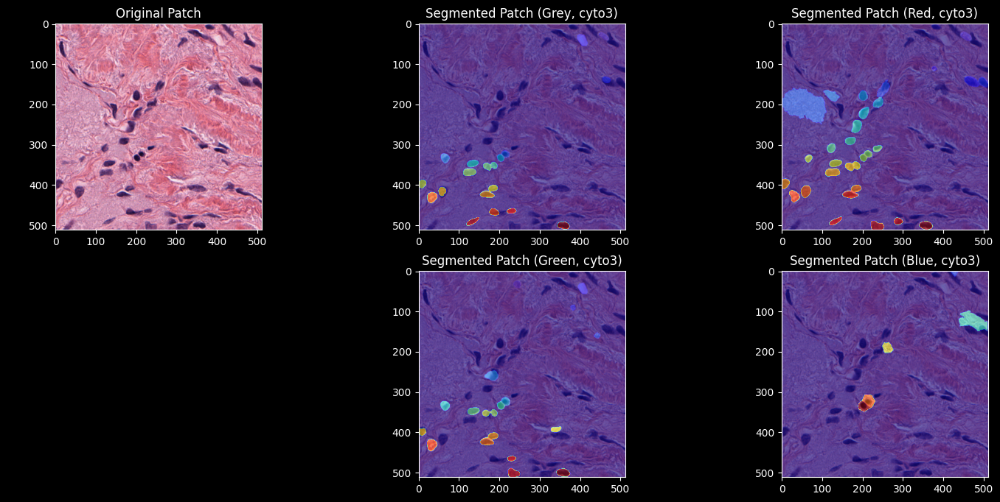

...

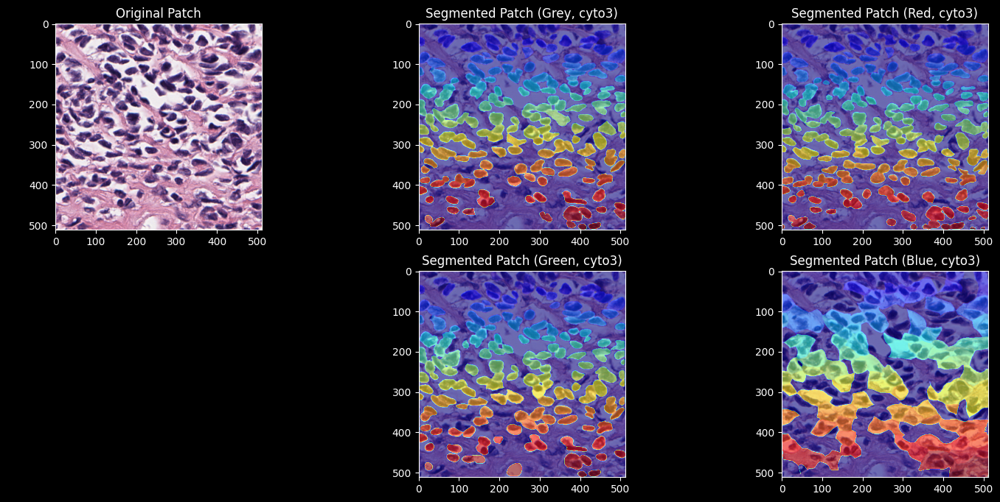

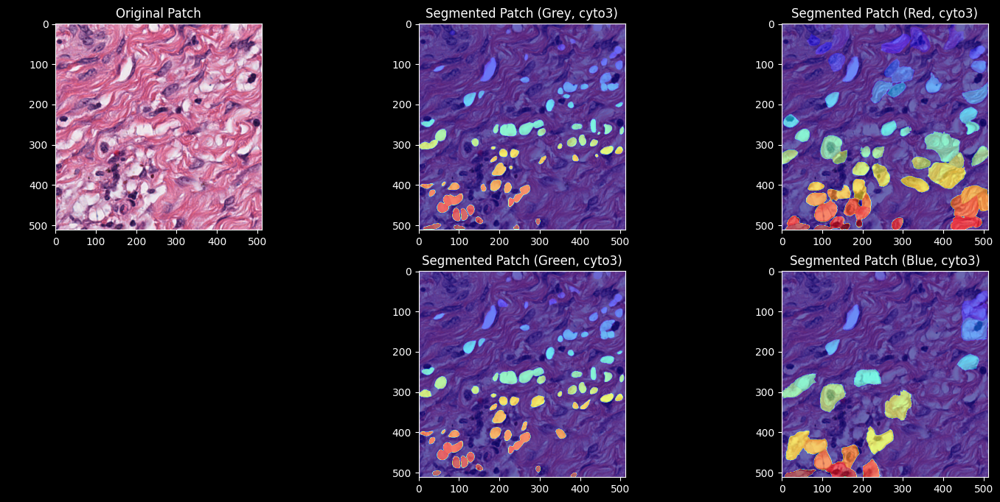

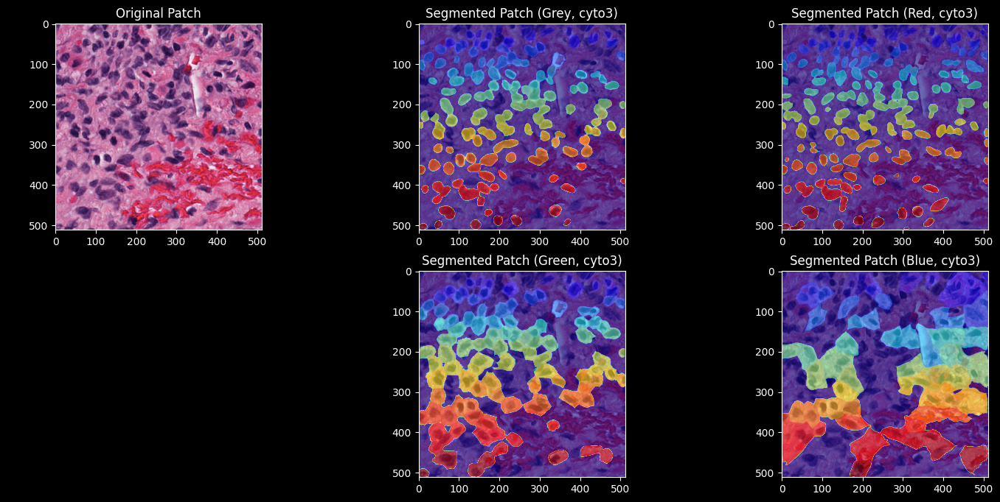

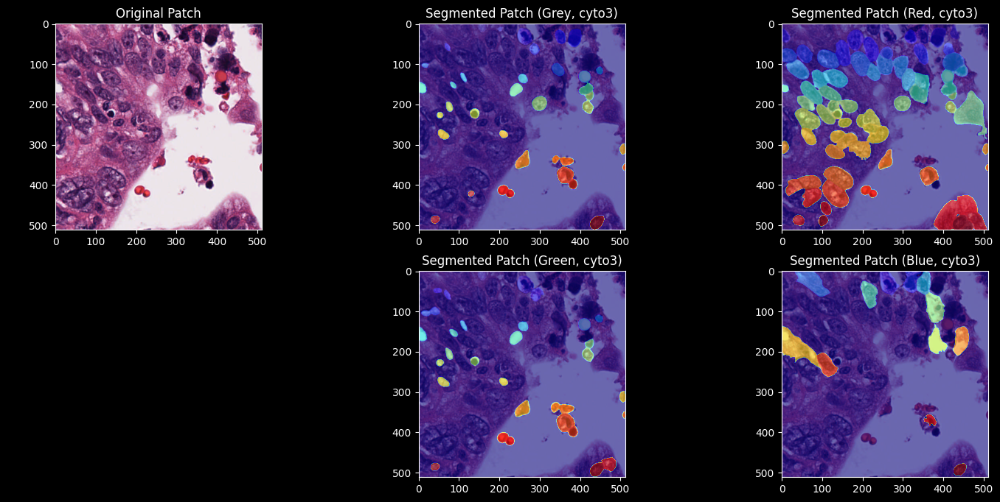

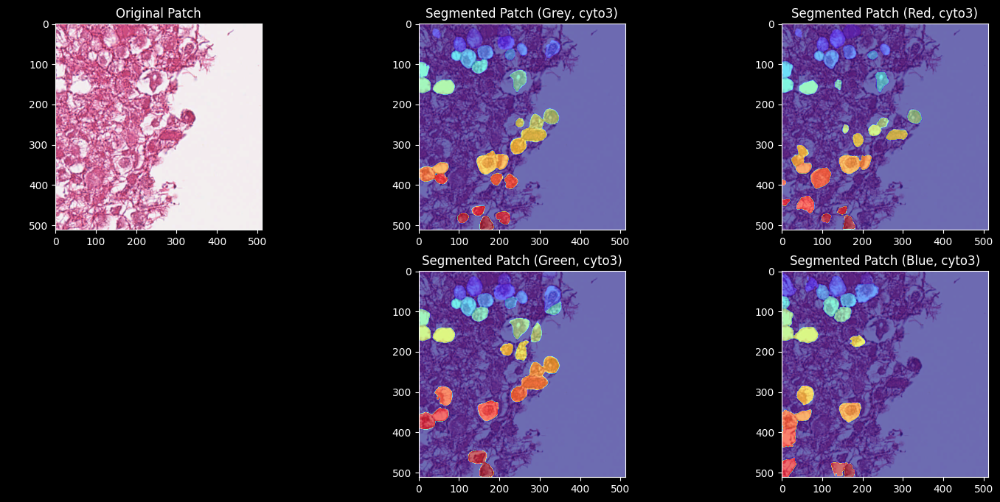

In [12]:
visualize_segmentation(all_patches, segmented_patches)

# Segmentation Results and Improvements Report

## Introduction
This report presents the findings and recommendations for improving the performance of the Cellpose segmentation model on various tissue samples. The model's performance varies depending on the channels used for segmentation, with the best results obtained using either `channels=[0,0]` or `channels=[1,0]` (segmenting on grayscale/red, with the nucleus in grayscale). However, the model's performance is inconsistent across different tissue samples, likely due to images that fall outside the training dataset distribution.

## Segmentation Results
### Strengths
- The default Cellpose model generally performs well on in-distribution examples.
- The model is relatively small, fast, and efficient.
- GPU is not strictly required.
- Fully open-source, with a well-documented GitHub repository and website.

### Weaknesses
- Performance drops significantly on out-of-distribution (OOD) examples, particularly for very white/pale or very dark/maroon images.
- The model sometimes focuses on irrelevant features, such as white spots or other cells, leading to misclassification and ignoring the nuclei.
- When nuclei have varying intensities (light and dark), the model tends to segment only one type.

## Recommendations for Improvement

To address the model's poor performance on OOD examples, we recommend fine-tuning the model on a custom dataset. The Cellpose documentation provides information on the required dataset formats and training procedures. Fine-tuning the model on a diverse dataset that includes challenging examples should improve its generalization capabilities.

### Data Augmentation and Preprocessing
In the absence of labeled training data, we suggest the following preprocessing techniques to improve performance:
- Inverting colors or applying transformations to the images before they are fed into the model to try to obtain better performance on difficult examples.
- Adjusting the segmentation channel on a case-by-case basis to find a clean segmentation for difficult examples.

By preprocessing the images and obtaining accurate segmentations, these examples can be used as additional training data for fine-tuning the base model, so that it generalizes to these difficult examples.

### Threshold-based Segmentation
In many images, cells appear as distinct dark spots (please correct me here, I am not a biologist!). For these cases, a simple threshold-based segmentation approach could be employed. These segmented images can then be used as training data for fine-tuning the model, enhancing its performance on similar examples.

### Ensemble Learning
Ensemble learning, which combines multiple models to create an aggregate model with better performance, could be considered as a temporary solution to gather more training data. However, this approach is not recommended for long-term use due to its high computational cost and slow processing speed, which may hinder the efficient processing of large image datasets.

## Conclusion
The Cellpose segmentation model demonstrates strong performance on in-distribution examples but struggles with out-of-distribution samples. To improve the model's generalization capabilities, we recommend fine-tuning it on a custom dataset that includes challenging examples. Additionally, data augmentation, preprocessing techniques, and threshold-based segmentation can be employed to generate more training data in the absence of labeled examples. By implementing these recommendations, the model's performance and robustness across various tissue samples should significantly improve.

## Next Steps
1. Collect and curate a diverse dataset of tissue samples, including challenging OOD examples. In the absence of training data, the following techniques could be employed to create a dataset:
   1. Preprocess images using techniques such as color inversion and tailored segmentation channel adjustment to obtain accurate segmentations for difficult examples.
   2. Employ threshold-based segmentation for images with distinct dark spots representing cells.
   3. Use ensemble learning with other libraries/models to gather more training data, provided this leads to accurate segmentations.
2. Fine-tune the Cellpose model using the dataset, following the documentation provided on the Cellpose GitHub repository and website.
3. Evaluate the fine-tuned model's performance on a test set containing both in-distribution and OOD examples to assess the effectiveness of the improvements.
4. Continuously monitor the model's performance and iterate on the improvement process as needed to ensure consistent and accurate segmentation results across a wide range of tissue samples.